#HR Analytics Project- Understanding the Attrition in HR
Problem Statement:
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
!pip install mlrose
!pip install scikit-pyplot
import six
import sys
sys.modules['sklearn.externals.six']=six
import mlrose
from imblearn.over_sampling import SMOTE
from yellowbrick.classifier.rocauc import roc_auc
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
import warnings
warnings.filterwarnings('ignore')

ERROR: Could not find a version that satisfies the requirement scikit-pyplot (from versions: none)
ERROR: No matching distribution found for scikit-pyplot


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
data=pd.read_csv('/content/WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [3]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [4]:
data.shape

(1470, 35)

In [5]:
data.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

DOnt have any null values in this data

In [6]:
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

#Univariate Analysis

In [8]:
col=['Attrition','BusinessTravel','Department','Education','EducationField','Gender','JobRole','MaritalStatus','Over18','OverTime',
     'DistanceFromHome','EmployeeNumber','EnvironmentSatisfaction','JobInvolvement','JobLevel','NumCompaniesWorked','PerformanceRating',
     'RelationshipSatisfaction','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','WorkLifeBalance','YearsAtCompany',
     'YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']

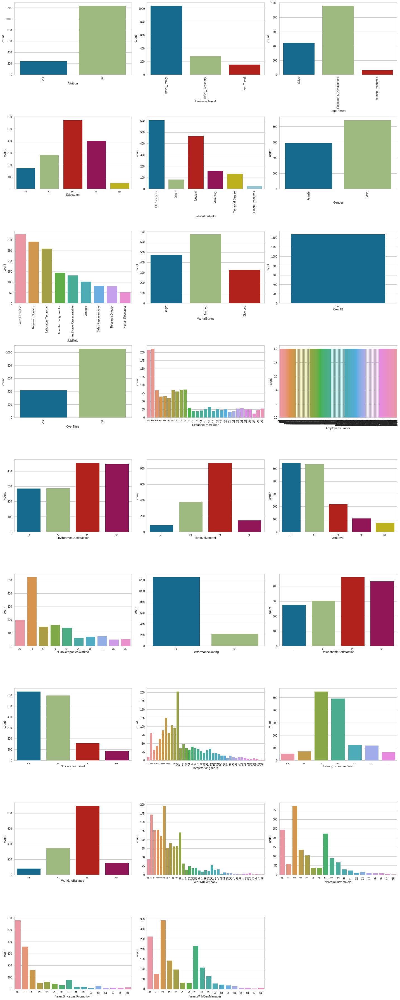

In [9]:
plt.figure(figsize=(20,55))
for i in range(0,len(col)):
  plt.subplot(10,3,i+1)
  sns.countplot(data[col[i]])
  plt.xticks(rotation=90)
  plt.tight_layout()

#Observation
1-From attrition i can say yes has less count and no has more count

2-From BusinessTravel i can say most of the peoples in company are those who Travel_Rarely then people who Travel_Frequently then non-travel

3-From department i can say most of the people are from Research & Development then sales and then HR

4-from education no. of 3 has high count means most of the people are average educated and no. of 5 is less means there are less people who are highly educated like phd

5-from education field i can say people are from Life Sciences are more as compare to others

6-From Gender males are more and female are less

7-from job role i can sale Sales Executive count is max and HR count is less as compare to others means more people are from SE and less people are from HR

8-From MaritalStatus i can say people who are married are high and then single people and then others

9-from over18 i can say all peoples are 18+ in the company

10-from overtime i can say most of the people dont do overtime and some people do

11-from distance from home most of the people have less distance to company

12-from environment satisfaction the count are almost equal 50% people like it 50% dont like that much

13-from jobinvolvement no.3 has the highest count

14-from job level 1 and 2 have high count as compare to other 

15-from performance rating i can say 3 has the high count and 4 has less 

16-from realtionship satisfaction 3 has the high count means average

17-from yearsatcoompany there are peoples who mostly work for 10 years last and some peoples who work more then 10 years

18-from total working years i can say most of the people have 10 years experience and less people who have greater than 10 year of experience

19-from yearlastpromotion i can say mostly all people get promotion within 1-3 years 

#Checking distribution curve of continuous columns

In [10]:
num_cols=['MonthlyIncome','MonthlyRate','DailyRate']

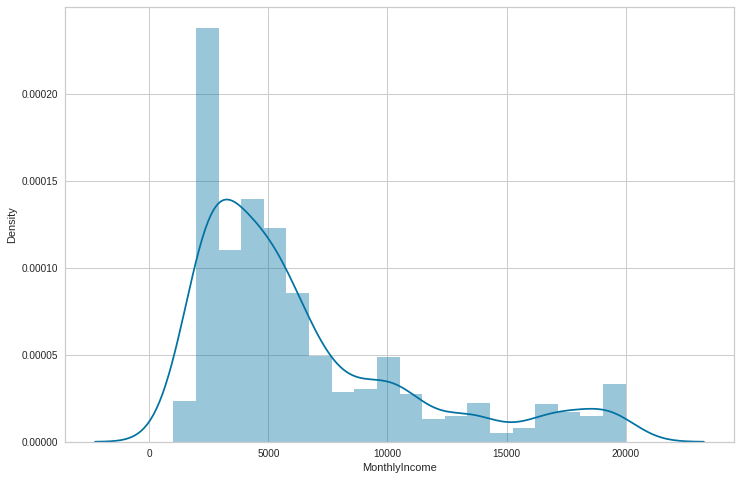

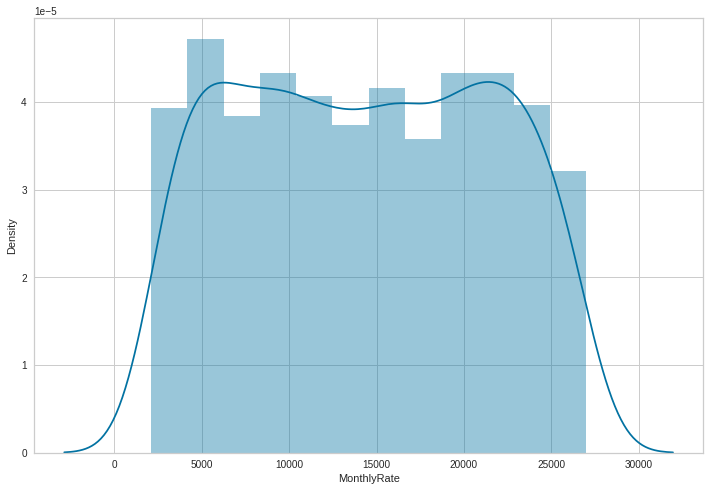

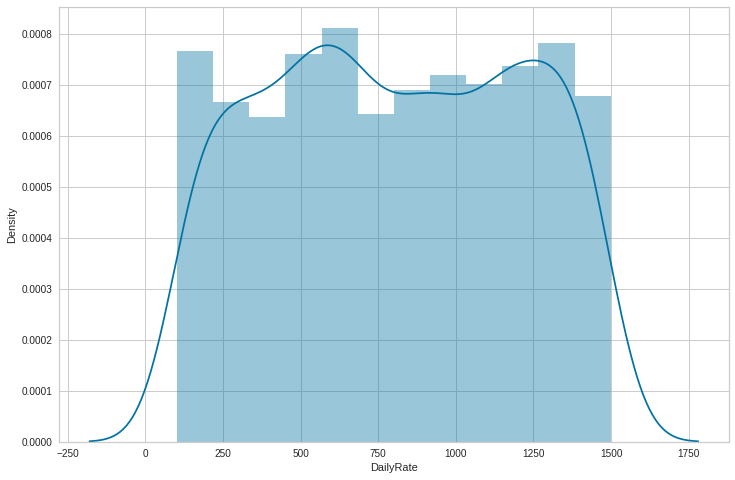

In [11]:
for i in range(0,len(num_cols)):
  plt.figure(figsize=(12,8))
  sns.distplot(data[num_cols[i]])
  plt.show()

#Observation
monthly income is right skewed and other have middle high peak

#Bivariate Analysis

In [12]:
all=['Age', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager']

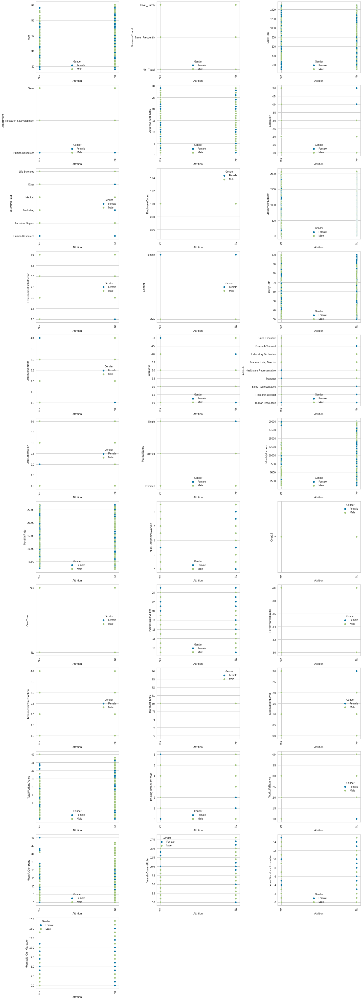

In [13]:
plt.figure(figsize=(20,55))
for i in range(0,len(all)):
  plt.subplot(12,3,i+1)
  sns.scatterplot(x=data['Attrition'],y=data[all[i]],hue=data['Gender'])
  plt.xticks(rotation=90)
  plt.tight_layout()

From upper graph all i can say is thw quantity of male are high as compare to females in most of every features

In [14]:
data_male=data.loc[data['Gender']=='Male'].set_index('YearsAtCompany')
data_female=data.loc[data['Gender']=='Female'].set_index('YearsAtCompany')

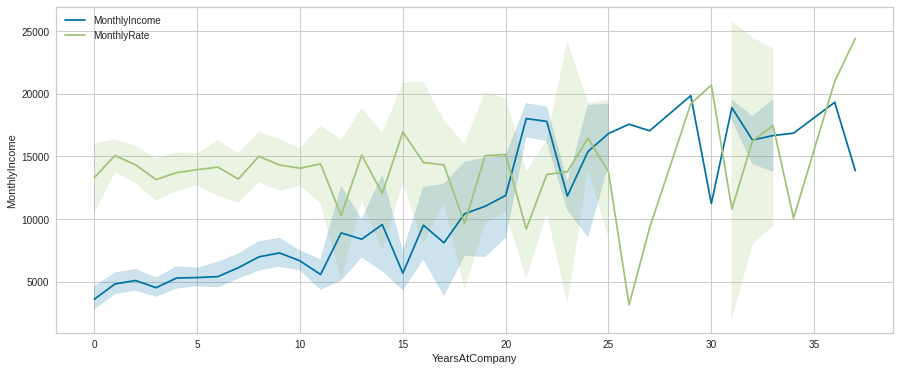

In [15]:
plt.figure(figsize=(15,6))
sns.lineplot(data=data_male['MonthlyIncome'],label='MonthlyIncome')
sns.lineplot(data=data_male['MonthlyRate'],label='MonthlyRate')

From upper graph i can say as the year increases in company the more salary and high monthly rate you have

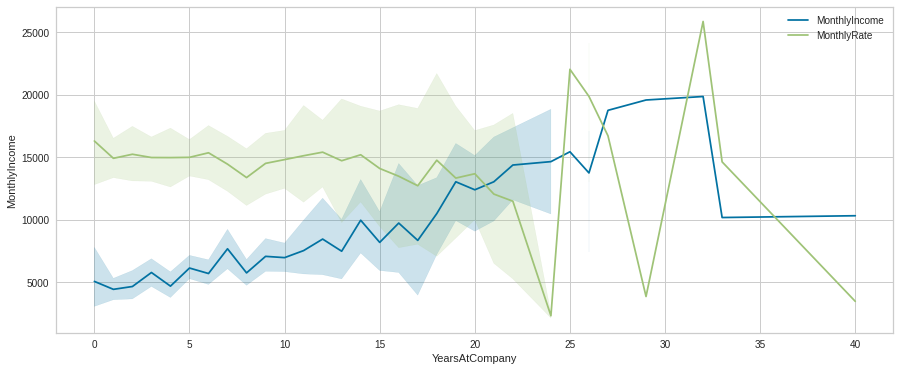

In [16]:
plt.figure(figsize=(15,6))
sns.lineplot(data=data_female['MonthlyIncome'],label='MonthlyIncome')
sns.lineplot(data=data_female['MonthlyRate'],label='MonthlyRate')

As the time increasing rate and income also increasing

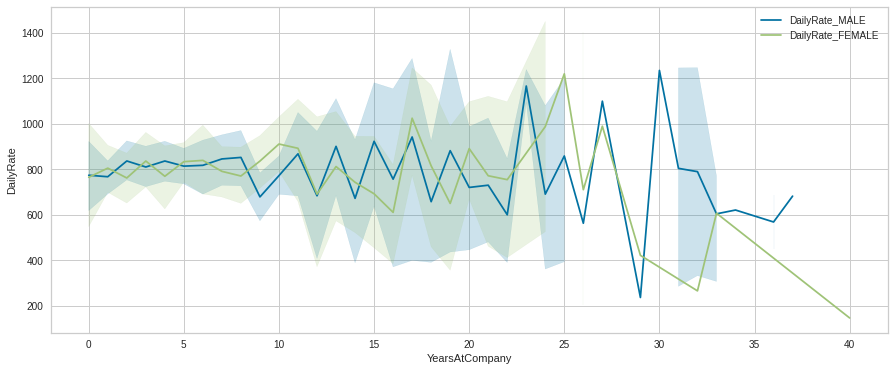

In [17]:
plt.figure(figsize=(15,6))
sns.lineplot(data=data_male['DailyRate'],label='DailyRate_MALE')
sns.lineplot(data=data_female['DailyRate'],label='DailyRate_FEMALE')

Before year 30 i can say female have the high dailyrate as compare to man but after 30 man is having more dailyrate

In [18]:
data1=data.groupby('Age')['MonthlyIncome'].sum()
data1=data1.reset_index()
data1=data1.sort_values(by=['MonthlyIncome'],ascending=False)

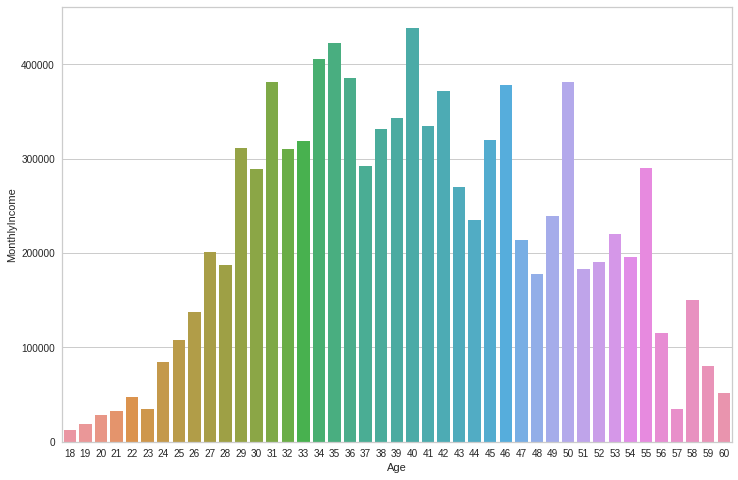

In [19]:
plt.figure(figsize=(12,8))
sns.barplot(x='Age',y='MonthlyIncome',data=data1)

#Obseravtion 
1- we can see the age 41 has high monthyincome and age of people 18-23 and 57,60 has less monthlyincome

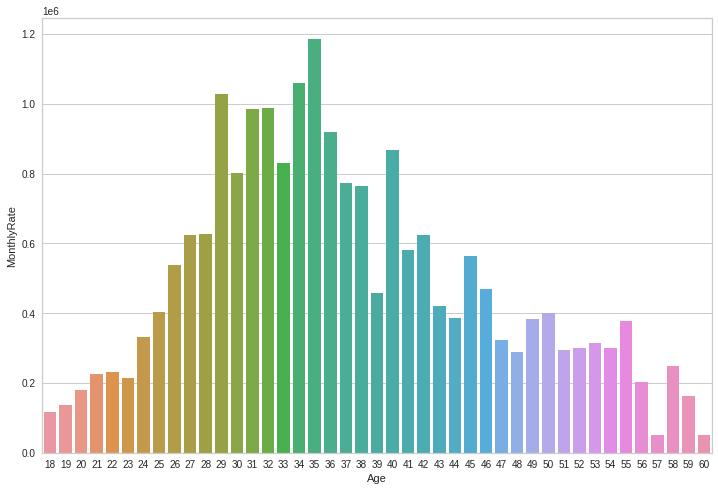

In [20]:
data2=data.groupby('Age')['MonthlyRate'].sum()
data2=data2.reset_index()
data2=data2.sort_values(by=['MonthlyRate'],ascending=False)
plt.figure(figsize=(12,8))
sns.barplot(x='Age',y='MonthlyRate',data=data2)

Age 36 have the high monthly rate and age 18-20 have very less monthly rate and also 57 and 60 age people have less monthlyrate

Text(0.5, 1.0, 'Department wise monthlyincome on bases of educationfield')

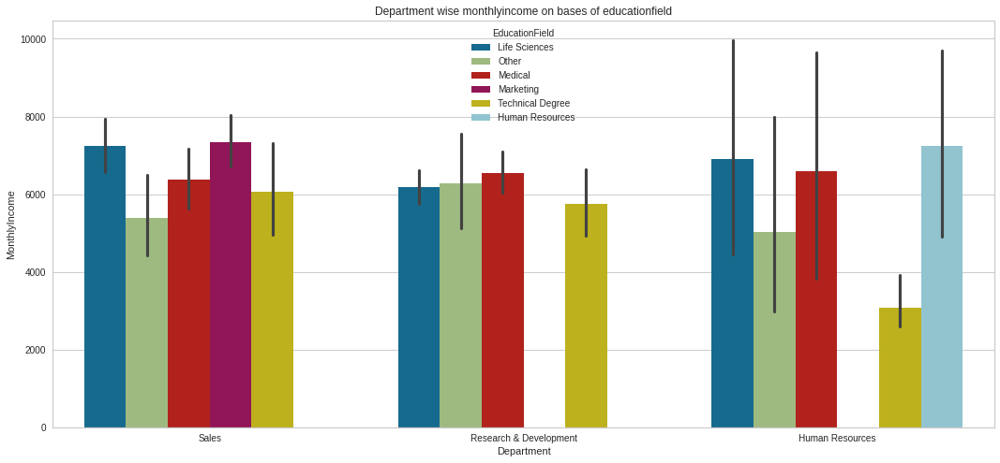

In [21]:
plt.figure(figsize=(18,8))
sns.barplot(x='Department',y='MonthlyIncome',data=data,hue='EducationField')
plt.title("Department wise monthlyincome on bases of educationfield")

#Observation
1-according to sales department life science edcation field has high salary and other has less salary

2-according to research & developement department medical education field has high salary and technical degree has less salary

3-according to human resources department human resources education field has high salalry and technical resources has less salary

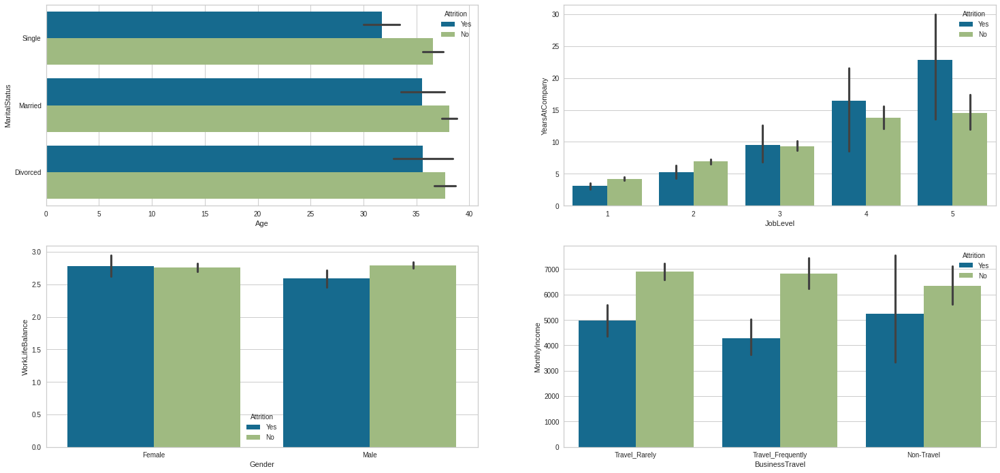

In [22]:
plt.figure(figsize=(25,25))
plt.subplot(4,2,1)
sns.barplot(y='MaritalStatus',x='Age',data=data,hue='Attrition')
plt.subplot(4,2,2)
sns.barplot(y='YearsAtCompany',x='JobLevel',data=data,hue='Attrition')
plt.subplot(4,2,3)
sns.barplot(y='WorkLifeBalance',x='Gender',data=data,hue='Attrition')
plt.subplot(4,2,4)
sns.barplot(y='MonthlyIncome',x='BusinessTravel',data=data,hue='Attrition')

#Observation
1-from MaritalStatus and age i can say attrtition no is high as compare to yes

2-from YearsAtCompany and joblevel i can say attrition yes has more count means people have really did hardwork to reach at this position

3-from WorkLifeBalance and gender i can say female has more attrition rate

4-from monthlyincome and travel i can say attition no has high rate 

In [23]:
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


#Selecting only objects columns to encode them

In [24]:
data_obj=data.select_dtypes(include=['object'])

In [25]:
data_obj

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Y,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,Y,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Y,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Y,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
...,...,...,...,...,...,...,...,...,...
1465,No,Travel_Frequently,Research & Development,Medical,Male,Laboratory Technician,Married,Y,No
1466,No,Travel_Rarely,Research & Development,Medical,Male,Healthcare Representative,Married,Y,No
1467,No,Travel_Rarely,Research & Development,Life Sciences,Male,Manufacturing Director,Married,Y,Yes
1468,No,Travel_Frequently,Sales,Medical,Male,Sales Executive,Married,Y,No


In [26]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder()

#I am using ordinalencoder because all of the columns are in order so its good to transform them into order

In [27]:
def ordinal_encode(df,column):
  df[column]=oe.fit_transform(df[column])
  return df

In [28]:
data=ordinal_encode(data,['Attrition','BusinessTravel','Department','EducationField','Gender','JobRole','MaritalStatus','Over18','OverTime'])

In [29]:
def preporcessing(df):
  df=df.copy()
  X=df.drop('Attrition',axis=1)
  y=df['Attrition']
  return X,y

In [30]:
X,y=preporcessing(data)

In [31]:
X

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2.0,1102,2.0,1,2,1.0,1,1,2,0.0,94,3,2,7.0,4,2.0,5993,19479,8,0.0,1.0,11,3,1,80,0,8,0,1,6,4,0,5
1,49,1.0,279,1.0,8,1,1.0,1,2,3,1.0,61,2,2,6.0,2,1.0,5130,24907,1,0.0,0.0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,2.0,1373,1.0,2,2,4.0,1,4,4,1.0,92,2,1,2.0,3,2.0,2090,2396,6,0.0,1.0,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1.0,1392,1.0,3,4,1.0,1,5,4,0.0,56,3,1,6.0,3,1.0,2909,23159,1,0.0,1.0,11,3,3,80,0,8,3,3,8,7,3,0
4,27,2.0,591,1.0,2,1,3.0,1,7,1,1.0,40,3,1,2.0,2,1.0,3468,16632,9,0.0,0.0,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1.0,884,1.0,23,2,3.0,1,2061,3,1.0,41,4,2,2.0,4,1.0,2571,12290,4,0.0,0.0,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,2.0,613,1.0,6,1,3.0,1,2062,4,1.0,42,2,3,0.0,1,1.0,9991,21457,4,0.0,0.0,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,2.0,155,1.0,4,3,1.0,1,2064,2,1.0,87,4,2,4.0,2,1.0,6142,5174,1,0.0,1.0,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,1.0,1023,2.0,2,3,3.0,1,2065,4,1.0,63,2,2,7.0,2,1.0,5390,13243,2,0.0,0.0,14,3,4,80,0,17,3,2,9,6,0,8


In [32]:
X.drop(['EmployeeNumber','Over18','StandardHours'],axis=1,inplace=True)

I droped all this columns because they were not usefull over18 and standardname have only one value and employeenumber having only unique incremented values

#Multivariate Analysis

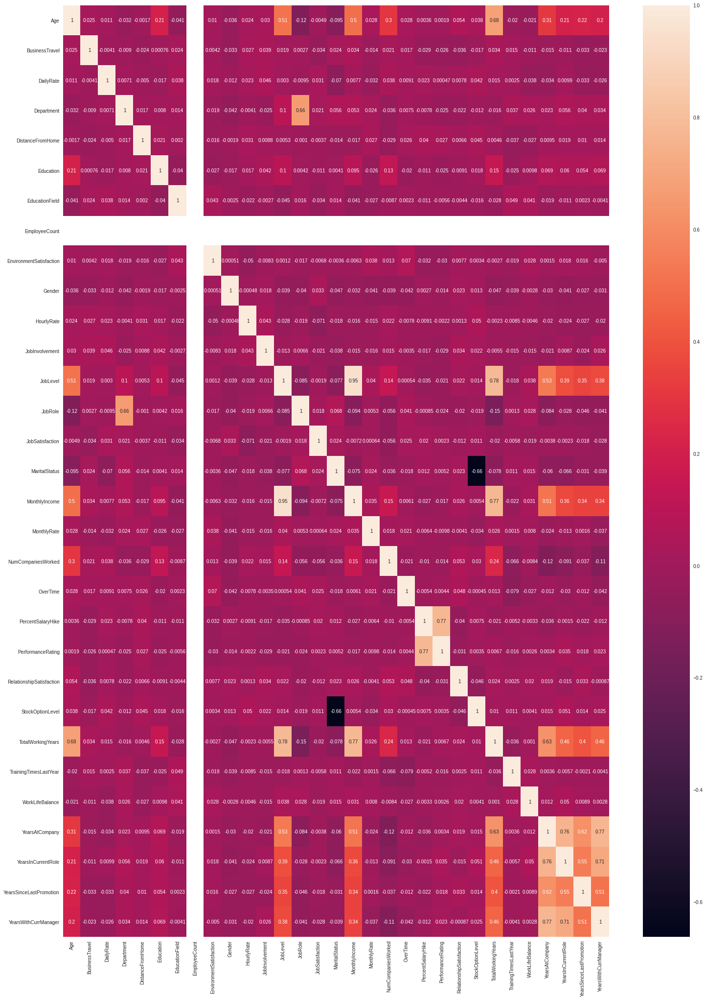

In [33]:
X_corr=X.corr()
plt.figure(figsize=(25,35))
sns.heatmap(X_corr,annot=True)

Some columns are really having good correlation like 80% annd 70% if two columns might be having 90% then i had to drop one column but in this data no one is having more then 90

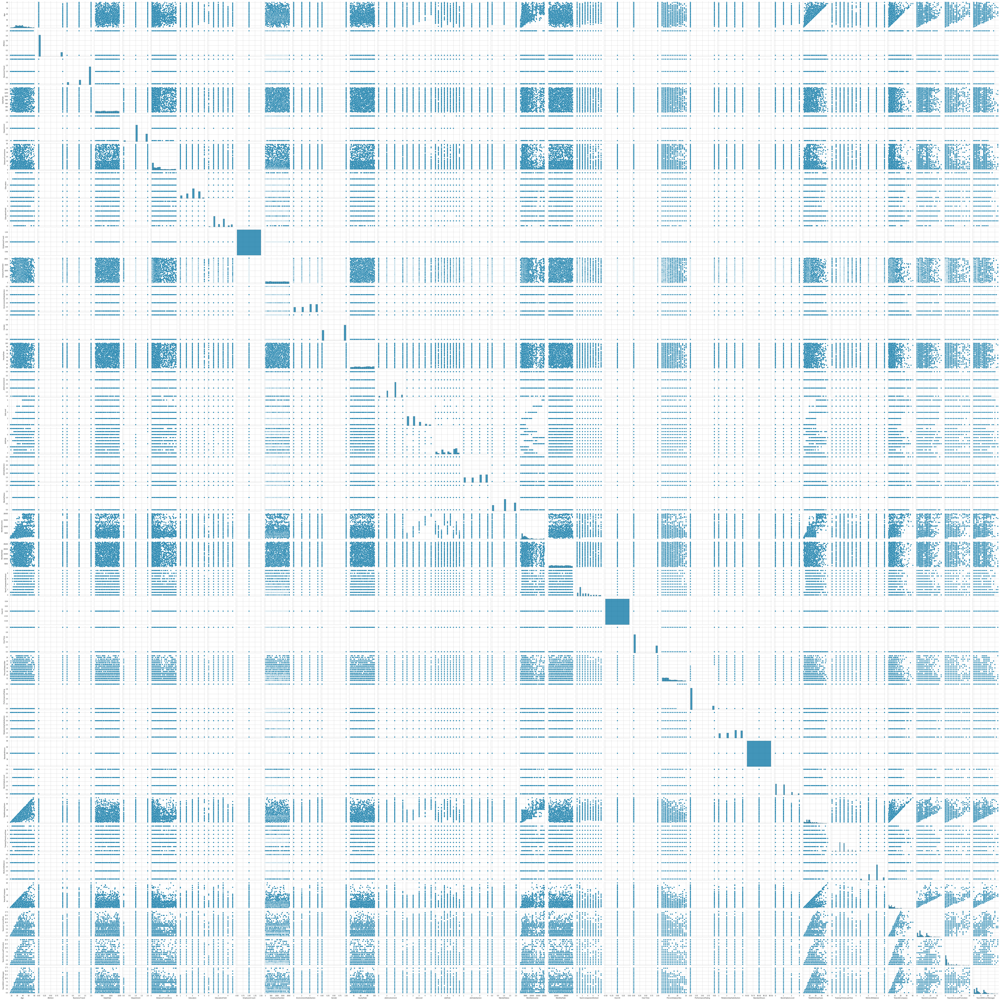

In [34]:
sns.pairplot(data)

#Checking Outliers

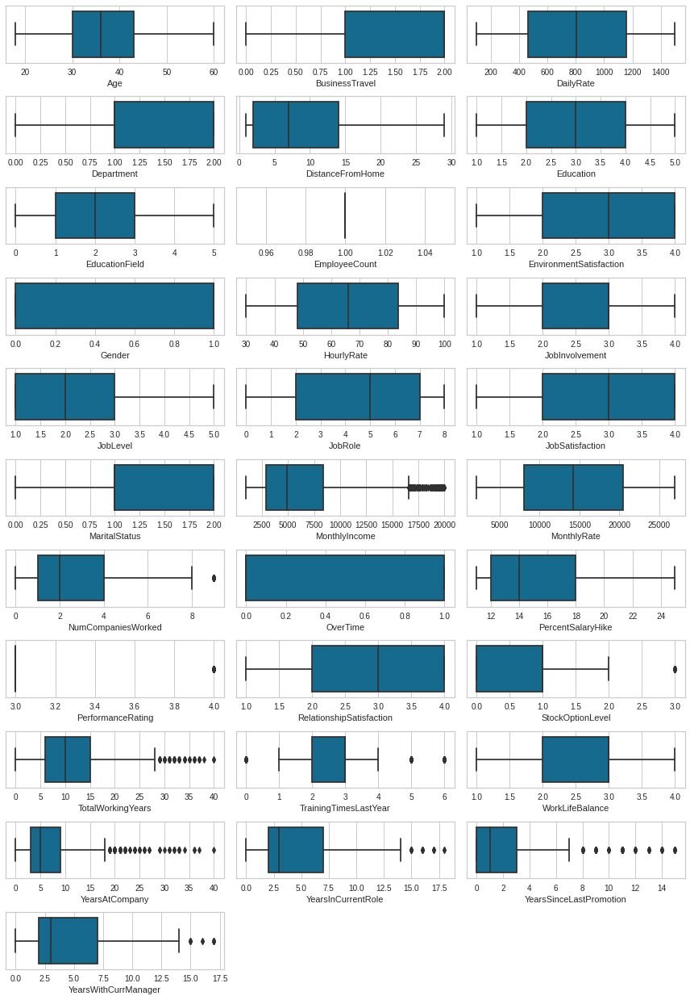

In [35]:
X_out=X.columns.values
plt.figure(figsize=(12,20))
for i in range(0,len(X_out)):
  plt.subplot(13,3,i+1)
  sns.boxplot(X[X_out[i]])
  plt.tight_layout()

Outliers are present lets try to remove them

#Replacing outliers with percentile method so we dont loose data

In [36]:
for col in X.columns:
  percentile=X[col].quantile([0.01,0.98]).values
  X[col][X[col]<=percentile[0]]=percentile[0]
  X[col][X[col]>=percentile[1]]=percentile[1]

#After removing outliers

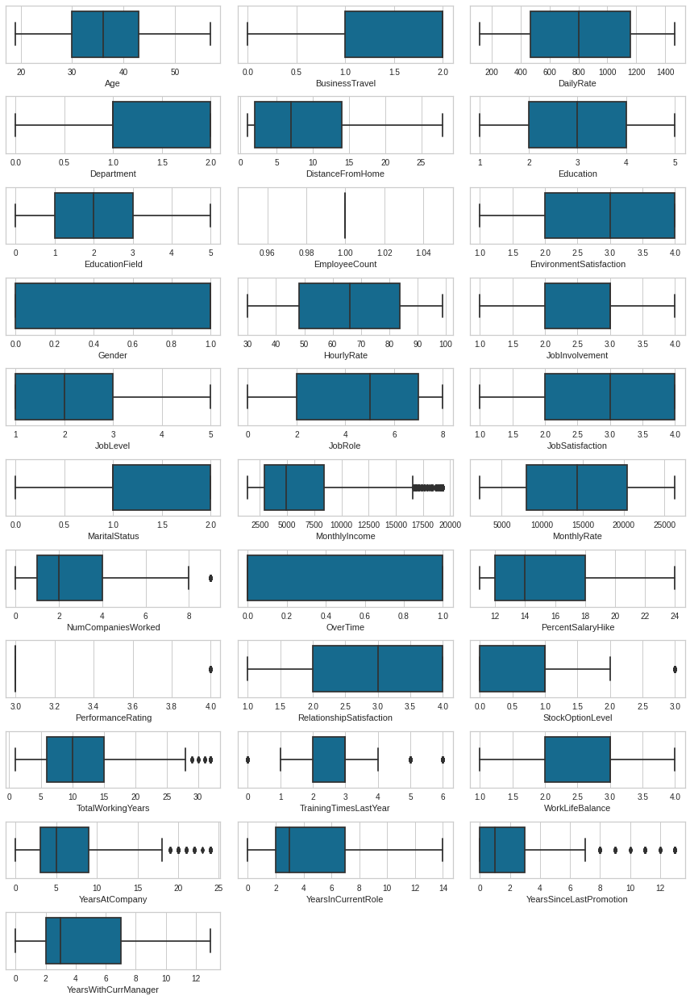

In [37]:
X_out=X.columns.values
plt.figure(figsize=(12,20))
for i in range(0,len(X_out)):
  plt.subplot(13,3,i+1)
  sns.boxplot(X[X_out[i]])
  plt.tight_layout()

Outliers have been removed easily

In [38]:
!pip install pingouin
import pingouin as pg

In [39]:
pg.linear_regression(X,y)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,7.133815e-01,0.130300,5.474918,5.157883e-08,0.213732,0.19734,0.457783,0.968980
1,Age,-3.739694e-03,0.001364,-2.741100,6.199161e-03,0.213732,0.19734,-0.006416,-0.001063
2,BusinessTravel,-5.415539e-04,0.013027,-0.041571,9.668466e-01,0.213732,0.19734,-0.026096,0.025013
3,DailyRate,-3.249154e-05,0.000022,-1.504479,1.326775e-01,0.213732,0.19734,-0.000075,0.000010
4,Department,5.633916e-02,0.022706,2.481288,1.320434e-02,0.213732,0.19734,0.011800,0.100879
5,DistanceFromHome,3.500960e-03,0.001076,3.254891,1.160724e-03,0.213732,0.19734,0.001391,0.005611
6,Education,-1.504162e-04,0.008662,-0.017365,9.861477e-01,0.213732,0.19734,-0.017142,0.016841
7,EducationField,5.532743e-03,0.006512,0.849590,3.956943e-01,0.213732,0.19734,-0.007242,0.018307
8,EnvironmentSatisfaction,-4.083757e-02,0.007940,-5.143573,3.067104e-07,0.213732,0.19734,-0.056412,-0.025263
9,Gender,3.583649e-02,0.017717,2.022719,4.328674e-02,0.213732,0.19734,0.001083,0.070590


Mostly all the columns are giving me good p value as compare to linear_regression but some are not but they might be related in other way if i do some other test

#Checking skewness

In [40]:
X.skew()

Age                         0.382046
BusinessTravel             -1.439006
DailyRate                  -0.006666
Department                  0.172231
DistanceFromHome            0.941426
Education                  -0.289681
EducationField              0.550371
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.035742
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.360261
MonthlyRate                 0.013541
NumCompaniesWorked          1.026471
OverTime                    0.964489
PercentSalaryHike           0.786109
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.005793
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
Y

There is skewness in data lets remove it

In [41]:
from sklearn.preprocessing import power_transform,StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,StratifiedKFold

In [42]:
x=X

#Removing Skewness

In [43]:
X_new=power_transform(X,method='yeo-johnson')
X_new=pd.DataFrame(X_new,columns=x.columns)

#The dataset is imbalanced so i need to balance it

In [44]:
smote=SMOTE(random_state=42)
X_res,y_res=smote.fit_resample(X_new,y)
X_new=pd.DataFrame(X_res,columns=x.columns)
y_new=pd.DataFrame(y_res,columns=['Attrition'])

In [45]:
X_new.skew()

Age                         0.078425
BusinessTravel             -0.922264
DailyRate                  -0.117130
Department                 -0.016222
DistanceFromHome           -0.148716
Education                  -0.143071
EducationField             -0.003713
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.084352
Gender                     -0.507196
HourlyRate                 -0.062936
JobInvolvement             -0.001539
JobLevel                    0.365273
JobRole                    -0.317090
JobSatisfaction            -0.078535
MaritalStatus              -0.412864
MonthlyIncome               0.000000
MonthlyRate                -0.197908
NumCompaniesWorked          0.049020
OverTime                    0.424321
PercentSalaryHike           0.225893
PerformanceRating           1.991368
RelationshipSatisfaction   -0.137192
StockOptionLevel            0.424385
TotalWorkingYears           0.030919
TrainingTimesLastYear      -0.019587
WorkLifeBalance             0.014580
Y

Skewness is been removed

#seeing the difference between imbalanced and balanced data

Text(0.5, 1.0, 'Balanced data')

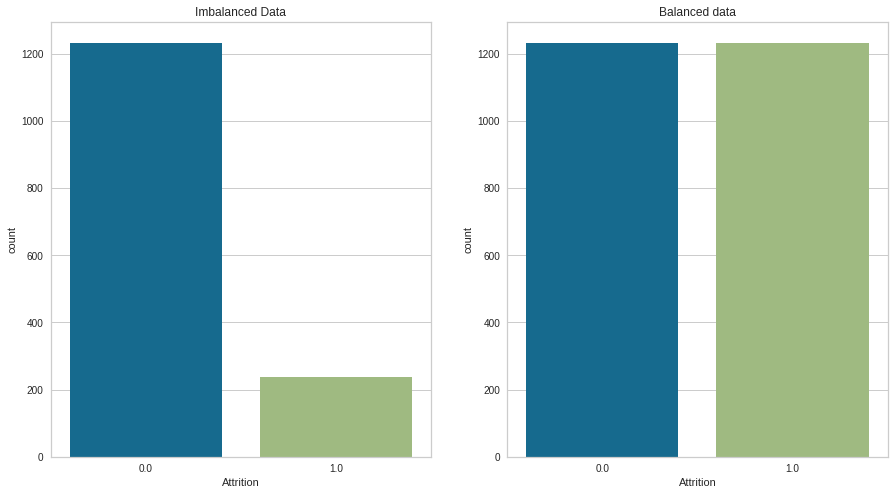

In [46]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
sns.countplot(data['Attrition'])
plt.title("Imbalanced Data")
plt.subplot(1,2,2)
sns.countplot(y_new['Attrition'])
plt.title("Balanced data")

#Feature Scaling

In [47]:
scaler=StandardScaler()
X_new=scaler.fit_transform(X_new)
X_new=pd.DataFrame(X_new,columns=(x.columns))

In [48]:
X_train,X_test,y_train,y_test=train_test_split(X_new,y_new,test_size=0.3,random_state=42)

In [49]:
from sklearn.ensemble import ExtraTreesClassifier,RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
!pip install scikit-plot
import scikitplot as skplt

I am using stratifiedkfold here because it select all classes at equal level 

In [50]:
skf=StratifiedKFold(n_splits=5)

#Training multiple models

In [51]:
models={
    "LogisticRegression":LogisticRegression(),
    "DecisionTreeRegressor":DecisionTreeClassifier(),
    "ExtraTreesRegressor":ExtraTreesClassifier(),
    "RandomForestRegressor":RandomForestClassifier(),
    "XGBRegressor":XGBClassifier(),
    "KNeighborsRegressor":KNeighborsClassifier()
}

*************************************************** LogisticRegression ************************************************************


Accuracy_Score 0.777027027027027


SCORE 0.777027027027027


Confusion metrics


[[283  86]
 [ 79 292]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.78      0.77      0.77       369
         1.0       0.77      0.79      0.78       371

    accuracy                           0.78       740
   macro avg       0.78      0.78      0.78       740
weighted avg       0.78      0.78      0.78       740

Cross_Val_Score 0.8006852643042641


ROC AUC CURVE
MODEL LEARNING CURVE


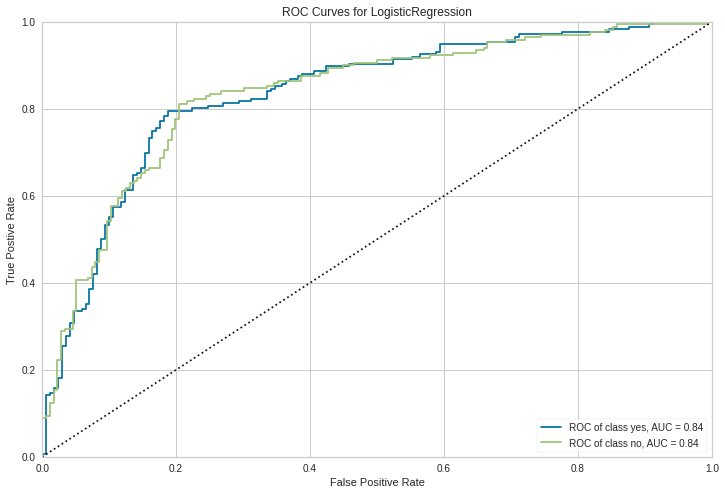

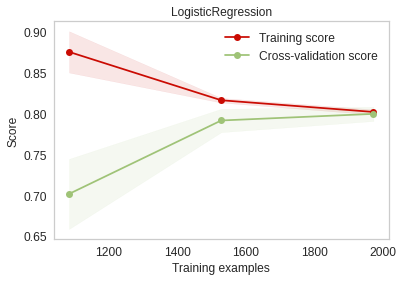

*************************************************** DecisionTreeRegressor ************************************************************


Accuracy_Score 0.8189189189189189


SCORE 0.8189189189189189


Confusion metrics


[[301  68]
 [ 66 305]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.82      0.82      0.82       369
         1.0       0.82      0.82      0.82       371

    accuracy                           0.82       740
   macro avg       0.82      0.82      0.82       740
weighted avg       0.82      0.82      0.82       740

Cross_Val_Score 0.8337153388623607


ROC AUC CURVE
MODEL LEARNING CURVE


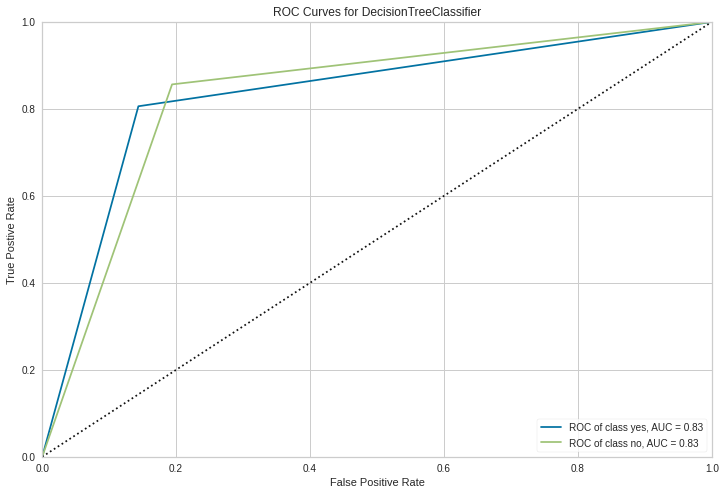

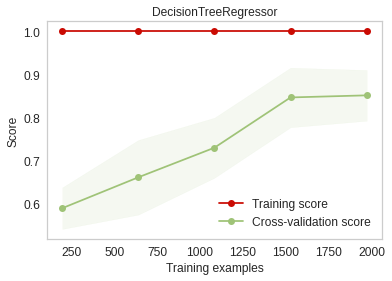

*************************************************** ExtraTreesRegressor ************************************************************


Accuracy_Score 0.9594594594594594


SCORE 0.9594594594594594


Confusion metrics


[[354  15]
 [ 15 356]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       369
         1.0       0.96      0.96      0.96       371

    accuracy                           0.96       740
   macro avg       0.96      0.96      0.96       740
weighted avg       0.96      0.96      0.96       740

Cross_Val_Score 0.94727318421714


ROC AUC CURVE
MODEL LEARNING CURVE


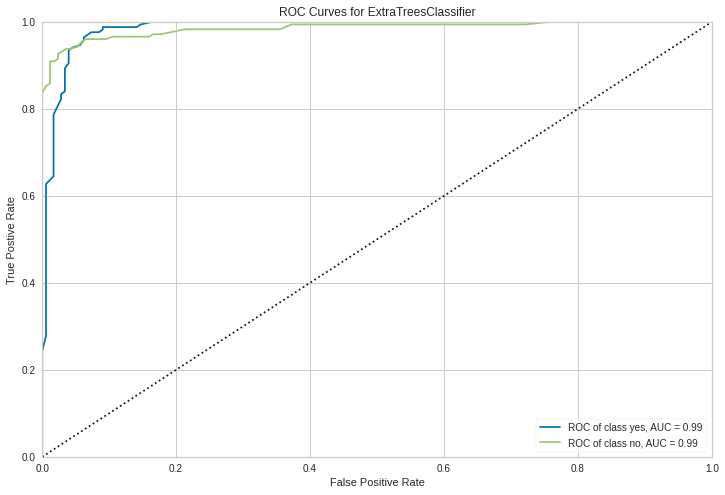

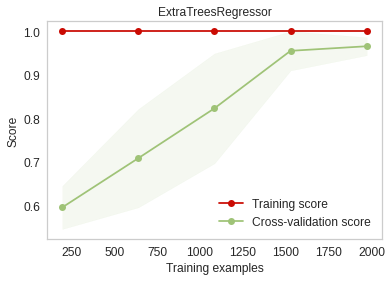

*************************************************** RandomForestRegressor ************************************************************


Accuracy_Score 0.9337837837837838


SCORE 0.9337837837837838


Confusion metrics


[[355  14]
 [ 35 336]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.91      0.96      0.94       369
         1.0       0.96      0.91      0.93       371

    accuracy                           0.93       740
   macro avg       0.94      0.93      0.93       740
weighted avg       0.94      0.93      0.93       740

Cross_Val_Score 0.9298952835720868


ROC AUC CURVE
MODEL LEARNING CURVE


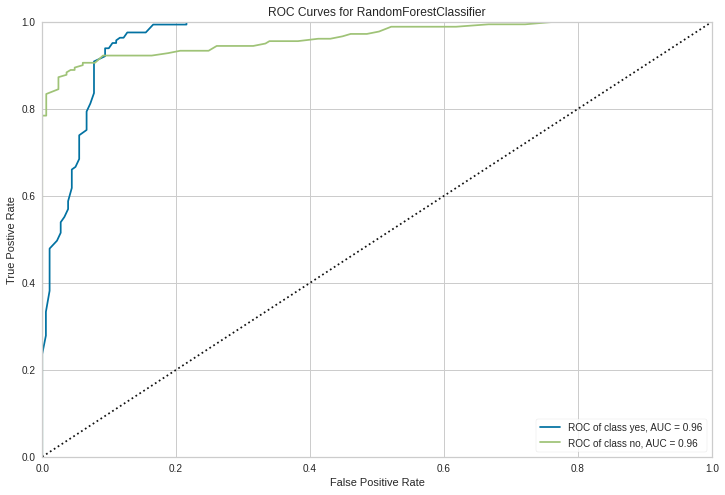

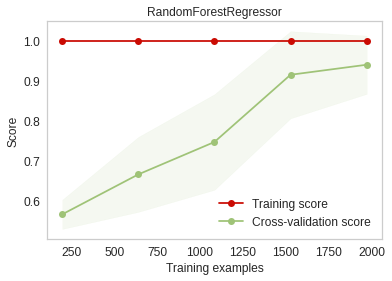

*************************************************** XGBRegressor ************************************************************


Accuracy_Score 0.927027027027027


SCORE 0.927027027027027


Confusion metrics


[[358  11]
 [ 43 328]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.89      0.97      0.93       369
         1.0       0.97      0.88      0.92       371

    accuracy                           0.93       740
   macro avg       0.93      0.93      0.93       740
weighted avg       0.93      0.93      0.93       740

Cross_Val_Score 0.9159922928709057


ROC AUC CURVE
MODEL LEARNING CURVE


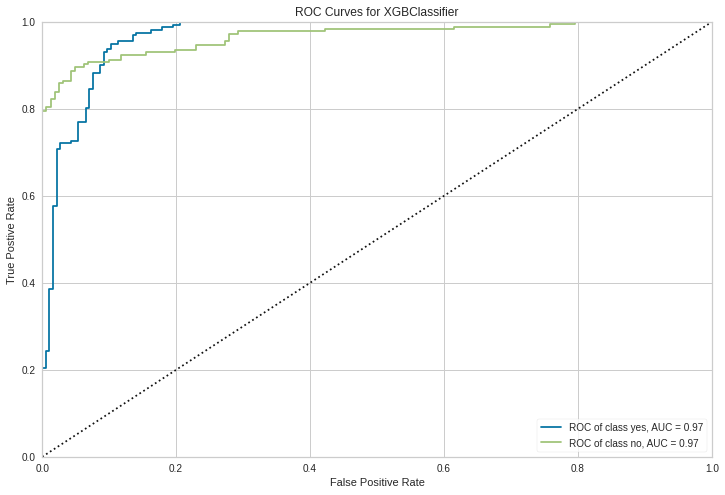

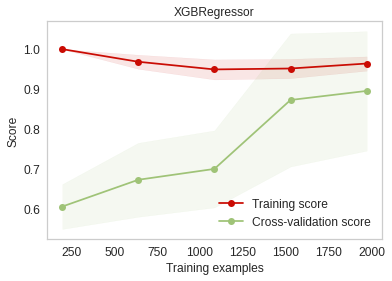

*************************************************** KNeighborsRegressor ************************************************************


Accuracy_Score 0.7932432432432432


SCORE 0.7932432432432432


Confusion metrics


[[229 140]
 [ 13 358]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.95      0.62      0.75       369
         1.0       0.72      0.96      0.82       371

    accuracy                           0.79       740
   macro avg       0.83      0.79      0.79       740
weighted avg       0.83      0.79      0.79       740

Cross_Val_Score 0.7832973108821312


ROC AUC CURVE
MODEL LEARNING CURVE


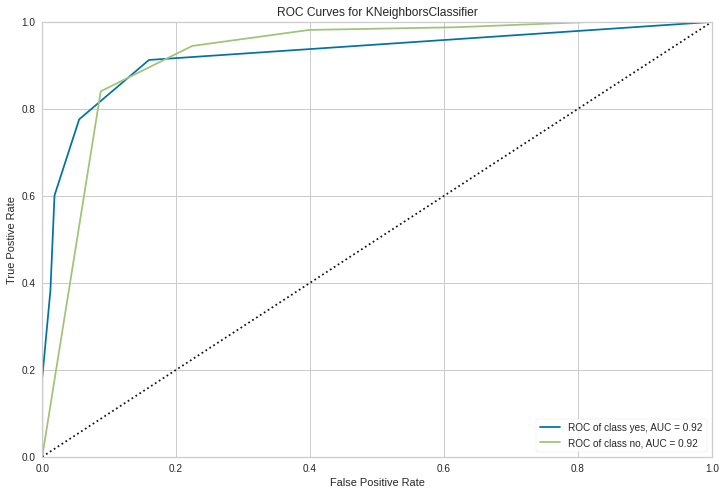

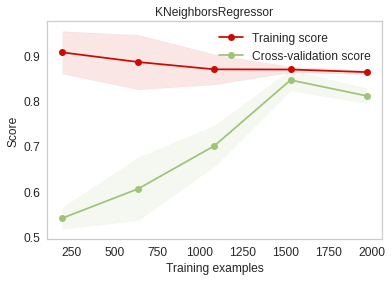

In [52]:
Score=[]
CVS=[]
MODEL=[]
for name,model in models.items():
  print("***************************************************",name,"************************************************************")
  MODEL.append(name)
  model.fit(X_train,y_train)
  y_pred=model.predict(X_test)
  print('\n')
  ac=accuracy_score(y_test,y_pred)
  Score.append(ac)
  print("Accuracy_Score",ac)
  print('\n')
  print("SCORE",model.score(X_test,y_test))
  print("\n")
  cm=confusion_matrix(y_test,y_pred)
  print('Confusion metrics')
  print('\n')
  print(cm)
  print("CLASSIFICATION REPORT")
  report=classification_report(y_test,y_pred)
  print('\n')
  print(report)
  csv=cross_val_score(model,X_train,y_train,cv=skf).mean()
  CVS.append(csv*100)
  print("Cross_Val_Score",csv)
  print('\n')
  print("ROC AUC CURVE")
  plt.figure(figsize=(12,8))
  roc_auc(model,X_train,y_train,X_test=X_test,y_test=y_test,classes=['yes','no'],micro=False,macro=False)
  print("MODEL LEARNING CURVE")
  skplt.estimators.plot_learning_curve(model,X_new,y_new,cv=skf,scoring='accuracy',text_fontsize='large',title=name)
  plt.show()

#I will choose ExtraTrees because i am gettinf good accuracy and cross val score and good roc_auc

Accuracy_Score 0.9621621621621622


SCORE 0.9621621621621622


Confusion metrics


[[355  14]
 [ 14 357]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96       369
         1.0       0.96      0.96      0.96       371

    accuracy                           0.96       740
   macro avg       0.96      0.96      0.96       740
weighted avg       0.96      0.96      0.96       740

Cross_Val_Score 0.9455323783195109

In [53]:
ETREE=ExtraTreesClassifier()
ETREE.fit(X_train,y_train)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

#Extratree hyperparameter tuning

In [54]:
param={
 'bootstrap': [False,True],
 'criterion': ['gini','entropy'],
 'max_depth': [None,1,2,3],
 'max_leaf_nodes': [None,1,2,3],
 'max_samples': [None,1,2,3],
 'n_estimators':[100,200,300]
}

In [55]:
skfs=StratifiedKFold(n_splits=7)

In [56]:
grid=GridSearchCV(estimator=ETREE,param_grid=param,cv=skfs,n_jobs=-1)

In [57]:
grid.fit(X_new,y_new)

GridSearchCV(cv=StratifiedKFold(n_splits=7, random_state=None, shuffle=False),
             error_score=nan,
             estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                                            class_weight=None, criterion='gini',
                                            max_depth=None, max_features='auto',
                                            max_leaf_nodes=None,
                                            max_samples=None,
                                            min_impurity_decrease=0.0,
                                            min_impurity_split=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2,
                                            m...
                                            n_estimators=100, n_jobs=None,
                                            oob_score=False, random_state=None,
                                            verbose=0

In [58]:
grid.best_score_

0.9704239634303374

cross_val_score increased to 97.04% from 94.72% 

In [59]:
grid.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': None,
 'max_leaf_nodes': None,
 'max_samples': 3}

#Now i am just putting values to now know about model performance to see metrics also

In [60]:
final_model=ExtraTreesClassifier(bootstrap= False,
 criterion= 'gini',
 max_depth= None,
 max_leaf_nodes= None,
 max_samples= None)

In [61]:
final_model.fit(X_train,y_train)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

In [62]:
y_pred1=final_model.predict(X_test)

#Final model roc_auc and learning curve

ROC AUC CURVE
MODEL LEARNING CURVE


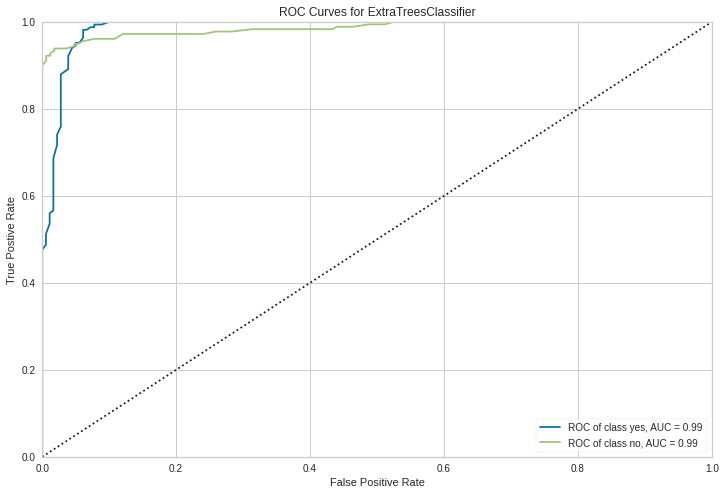

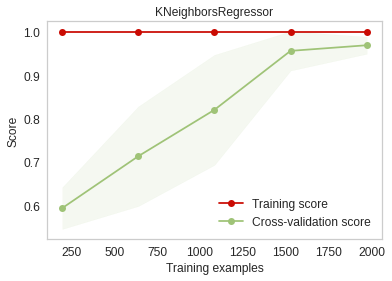

In [63]:
  print("ROC AUC CURVE")
  plt.figure(figsize=(12,8))
  roc_auc(final_model,X_train,y_train,X_test=X_test,y_test=y_test,classes=['yes','no'],micro=False,macro=False)
  print("MODEL LEARNING CURVE")
  skplt.estimators.plot_learning_curve(final_model,X_new,y_new,cv=skf,scoring='accuracy',text_fontsize='large',title=name)
  plt.show()

#Final model metrics

In [64]:
print("Accuracy Score",accuracy_score(y_test,y_pred1))
print("Confusion matrix")
print('\n')
print(confusion_matrix(y_test,y_pred1))
print("CLASSIFICATION REPORT")
print('\n')
print(classification_report(y_test,y_pred1))

Accuracy Score 0.9554054054054054
Confusion matrix


[[352  17]
 [ 16 355]]
CLASSIFICATION REPORT


              precision    recall  f1-score   support

         0.0       0.96      0.95      0.96       369
         1.0       0.95      0.96      0.96       371

    accuracy                           0.96       740
   macro avg       0.96      0.96      0.96       740
weighted avg       0.96      0.96      0.96       740



#Saving the gridsearch model as my main model

In [65]:
import joblib
joblib.dump(grid,'HRMODEL.obj')

['HRMODEL.obj']

#Loading model

In [66]:
model=joblib.load('/content/HRMODEL.obj')

In [67]:
model.predict(X_test)

array([0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 1., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1.,
       1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1., 0., 1., 1., 1.,
       0., 1., 0., 1., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1., 1.,
       1., 1., 0., 1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 0., 1., 0., 1.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 1., 1., 1., 1.,
       1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 1., 1.,
       0., 1., 0., 1., 0., 1., 1., 0., 1., 0., 1., 1., 0., 0., 0., 1., 0.,
       1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0.,
       1., 1., 1., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0., 0., 1., 0.,
       1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1., 1., 0.,
       0., 0., 0., 0., 1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 1., 0.

#Conclusion
1-In this dataset there were 35 columns 

2-I did EDA to understand the attrition for all features 

3-the data was imbalanced so i used smote because it balance the data synthetically so no rows repeat randomly 

4-and then build multiple models where EXTRATREES was giving me good accuracy

5-then i did hyperparameter tuning and increase the Cross val score 

6-and finally built a model the can predict the attrition with 97.04% accuracy 